In [3]:
from TO_sim.Animation import *
from TO_sim.To_Draw import *
from TO_sim.Hysteresis_Kuramoto import *
from IPython.display import HTML
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [285]:
t_end = 200
m = 6
N = 5000
dist = "Quantile Lorentzian"
dK = 0.2
dt = 0.1
Ksdf,Ksrdf = Hysteresis_pd(m,N=N,dK=dK,t_end=t_end,dist=dist,dt=dt)

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

In [ ]:
"Review/Review5/"

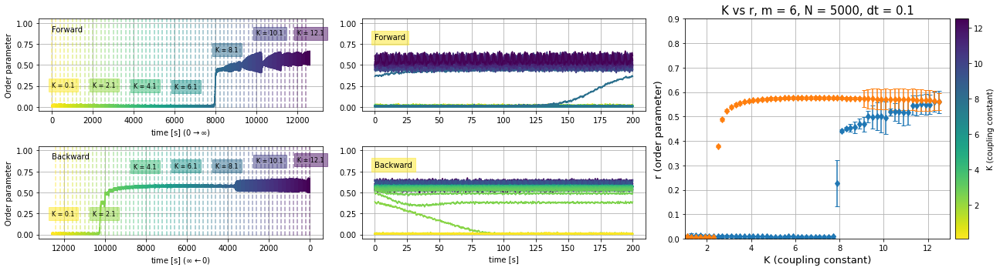

In [287]:
Time_R_df_total(Ksdf,Ksrdf,N,m,save=True,Folder_name="Review/Review5/")

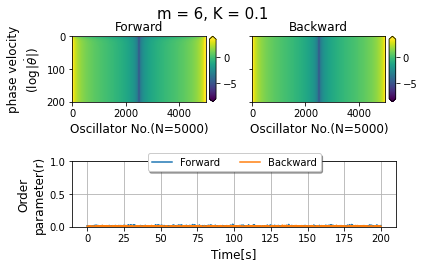

In [288]:
ani = Animation_logabs(Ksdf,Ksrdf,N,m)

In [289]:
HTML(ani.to_jshtml())

In [54]:
from celluloid import Camera

In [383]:
# cam = Camera(fig)
To_animate = []
K_draw = (6.3,6.5)
df = Ksdf
t_= df["ts"].iloc[0]
t_s = np.searchsorted(t_,125)
t_e = np.searchsorted(t_,200)

To_animate = []
# for K_ in K_draw:
K_=7.9
[To_animate.append((K_,t)) for t in range(t_s,t_e+1,10)] 

# [To_animate.append((K_+dK,t)) for t in range(0,10)] ;

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [394]:
diff = lambda x : np.diff(x,axis=0)
df_=df["dtheta_s"].apply(diff)[K_]
ts_=df["ts"].iloc[0]
# dK_e = round(dK_s+dK_,1)
omega = df["Omega"][K_]
max_ = np.max(df_)
min_ = np.min(df_)
# max_ = np.max(df_)/200
# min_ = np.min(df_)/200
print(max_,min_)

0.04928794440882356 -0.04914760284274322


In [361]:
np.c_[[1,2,3],[3,3,4]]

array([[1, 3],
       [2, 3],
       [3, 4]])

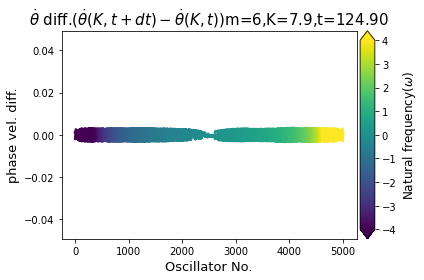

In [396]:
# max_ = np.max(df_)/200
# min_ = np.min(df_)/200

fig = plt.figure(facecolor='white')
ax = fig.subplots()
ax.set_ylim(min_,max_)
ax.set_xlabel("Oscillator No.",fontsize=13)
ax.set_ylabel("phase vel. diff.",fontsize=13)
# ax.set_ylabel("phase diff.",fontsize=13)
K_,t_e = To_animate[0]
t_s = t_e-1
t_s_time = ts_[t_s]
sca = ax.scatter(np.arange(1,N+1),(df_[t_e-1]),c=omega,vmin=-4,vmax=4,s=3)
ax.set_title(r'$\dot{\theta}$ diff.($\dot{\theta}(K,t+dt)-\dot{\theta}(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=15)
# ax.set_title(r'$\theta$ diff.($\theta(K,t+dt)-\theta(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)

# ax.text(1,max_,r'$\dot{\theta}$ diff.($\dot{\theta}(K,t+dt)-\dot{\theta}(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
# ax.text(1,max_,r'$\theta$ diff.($\theta(K,t+dt)-\theta(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cbar =fig.colorbar(sca, cax=cax, orientation='vertical',extend="both")
cbar.set_label("Natural frequency($\omega$)",fontsize=12)
fig.tight_layout()

def Update(To_animate):
    K_,t_e = To_animate
    t_s = t_e-1
    t_s_time = ts_[t_s]
    sca.set_offsets(np.c_[np.arange(1,N+1),(df_[t_s])])
    ax.set_title(r'$\dot{\theta}$ diff.($\dot{\theta}(K,t+dt)-\dot{\theta}(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=15)
    # ax.set_title(r'$\theta$ diff.($\theta(K,t+dt)-\theta(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)

    # # ax.scatter(np.arange(1,N+1),(df_[t_s]),c=omega,vmin=-4,vmax=4,s=3)
    # # ax.text(1,max_,r'$\dot{\theta}$ diff.($\dot{\theta}(K,t+dt)-\dot{\theta}(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
    # ax.text(1,max_,r'$\theta$ diff.($\theta(K,t+dt)-\theta(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
    # fig.colorbar(sca, cax=cax, orientation='vertical',extend="both")

# for K_,t_e in To_animate:
#     t_s = t_e-1
#     t_s_time = ts_[t_s]
#     # t_e_time = df["ts"][K_][t_e]
#     # plt.subplot(211)
#     sca = ax.scatter(np.arange(1,N+1),(df_[t_s]),c=omega,vmin=-4,vmax=4,s=3)
#     # ax.text(1,max_,r'$\dot{\theta}$ diff.($\dot{\theta}(K,t+dt)-\dot{\theta}(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
#     ax.text(1,max_,r'$\theta$ diff.($\theta(K,t+dt)-\theta(K,t)$)'+f''+f'm={m},K={K_},t={t_s_time:.02f}',fontsize=14)
#     fig.colorbar(sca, cax=cax, orientation='vertical',extend="both")
#     cam.snap()
# plt.subplot(212)
# plt.plot((df["theta_s"][dK_s][t_s] - df["theta_s"][dK_e][t_e]),'.')
# plt.title(r'$\theta$ diff.'+f'(K={dK_e}(end) - K={dK_s}(start))',fontsize=15)
# plt.xlabel("Oscillator No.",fontsize=13)
# plt.ylabel("phase diff.",fontsize=13)

In [397]:
ani = FuncAnimation(fig, Update, frames=To_animate, interval=50)

In [398]:
ani.save(f"Review/Review5/Phase vel. diff,N={N},K={K_},m={m}.mp4",dpi=400)

In [399]:
HTML(ani.to_jshtml())

In [62]:
import numpy as np
import matplotlib.pyplot as plt

In [101]:
def make_angle(df,K,time):
    iloc_ = np.searchsorted(df['ts'][K],time)
    theta = df["dtheta_s"][K][iloc_]
    sincos = lambda x: (np.sin(x),np.cos(x))
    sin_,cos_ = sincos(theta)
    return sin_,cos_

def make_r(df,K,time):
    iloc_ = np.searchsorted(df['ts'][K],time)
    r = df["rs"][K][iloc_]
    return 0,r

In [64]:
np.searchsorted(Ksdf['ts'][0.1],0.1)

1

In [102]:
def Draw_fig():
    fig = plt.figure(figsize=(10,10))
    plt.xlim(-1.1,1.1)
    plt.ylim(-1.1,1.1)
    return fig

In [106]:
make_r(df,K,time)

(0, 0.5465356687624442)

ValueError: s must be a scalar, or float array-like with the same size as x and y

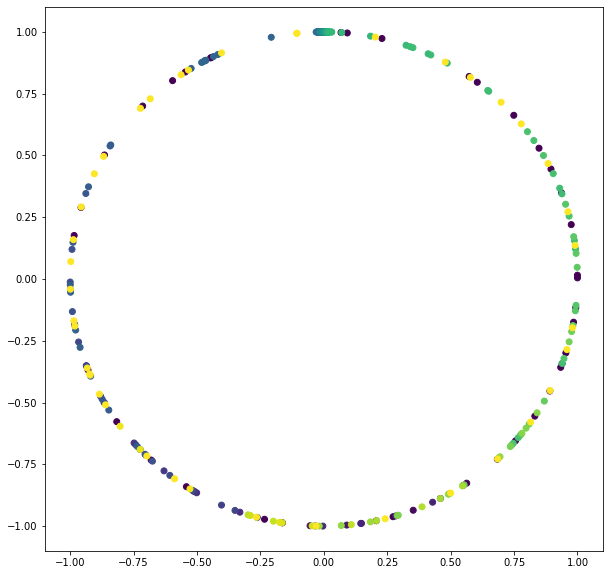

In [108]:
%matplotlib inline
Draw_fig()
K = 12.5
time = 10
df = Ksrdf
omega = df["Omega"][K]
plt.scatter(*make_angle(df,K,time),c=omega,vmin = -4,vmax=4)
plt.scatter(*make_r(df,K,time),'r')